<h2><center> 10-701 Introduction to Machine Learning (PhD) <br> Lecture 1: Intro to ML and Perceptron </center></h2> 


<h3><center> Leila Wehbe <br> Carnegie Mellon University  <br> Machine Learning Department </center></h3> 


<br>


Lecture based on [chapter 4](http://ciml.info/dl/v0_99/ciml-v0_99-ch04.pdf) from Hal Daumé III,  on Kilian Weinberger's [lecture 3](https://www.cs.cornell.edu/courses/cs4780/2018fa/lectures/lecturenote03.html) and on Tom Mitchell's [lecture 1](http://www.cs.cmu.edu/~tom/10701-S20/Intro-DTreesAndOverfitting-1-13-2020.pdf).

#### Lecture outcomes
- Definition of linear separator
- Perceptron algorithm
- Perceptron algorithm guarantees

### Links (use the version you need)


- [Notebook](https://github.com/lwehbe/10701/blob/F22/Lecture_01_perceptron.ipynb)

- [PDF slides](https://github.com/lwehbe/10701/raw/F22/Lecture_01_perceptron.slides.pdf)

## Welcome to 10-701 Intro to Machine Learning
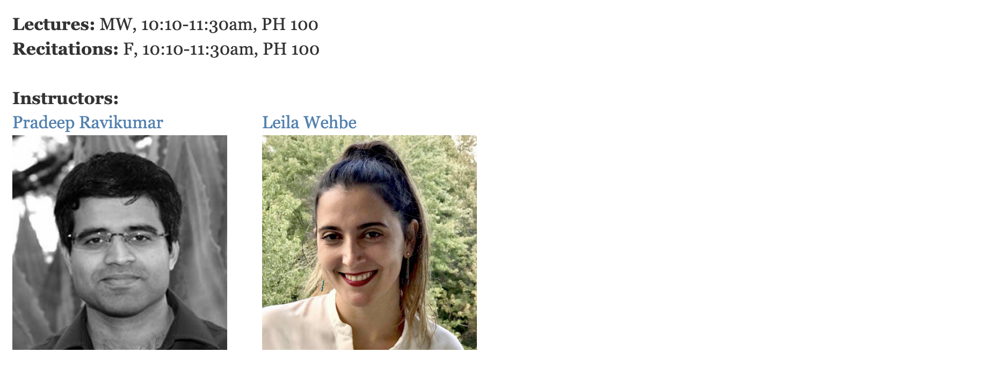
<!-- <div>
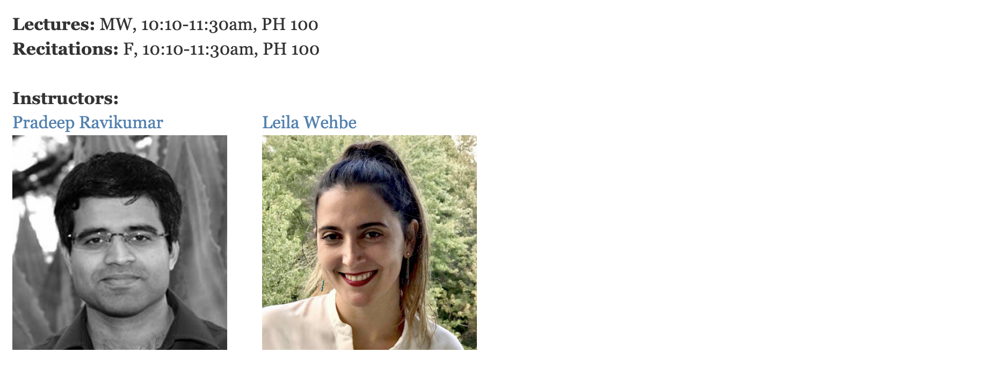
</div> -->

## Welcome to 10-701 Intro to Machine Learning
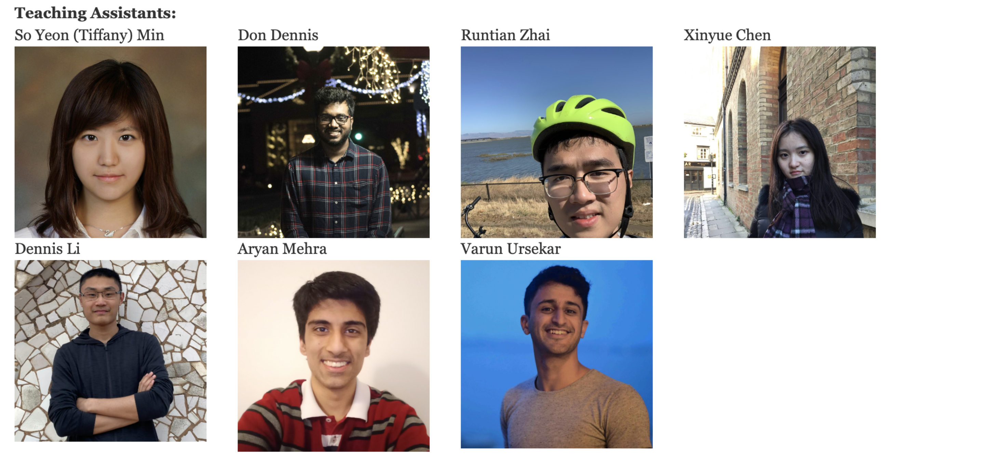

### Links

- [Website](https://www.cs.cmu.edu/~lwehbe/10701_F22/) (includes [schedule](https://www.cs.cmu.edu/~lwehbe/10701_F22/#schedule) and links to lectures)
- [Piazza](https://piazza.com/cmu/fall2022/10701)
- [Syllabus](https://www.cs.cmu.edu/~lwehbe/10701_F22/files/Syllabus.pdf)

### What is machine learning?

-  "How can we build computer programs that automatically improve their performance through experience?"

    - Study of algorithms that
        - improve their performance **P**
        - at some task **T**
        - with experience **E**
    - well-defined learning task: (**P**,**T**,**E**)

- How can we learn from data?

- How robust is what we learn? What types of assumptions do we make with different approaches? What are the guarantees? How do we pick an approach?

### Computer Vision
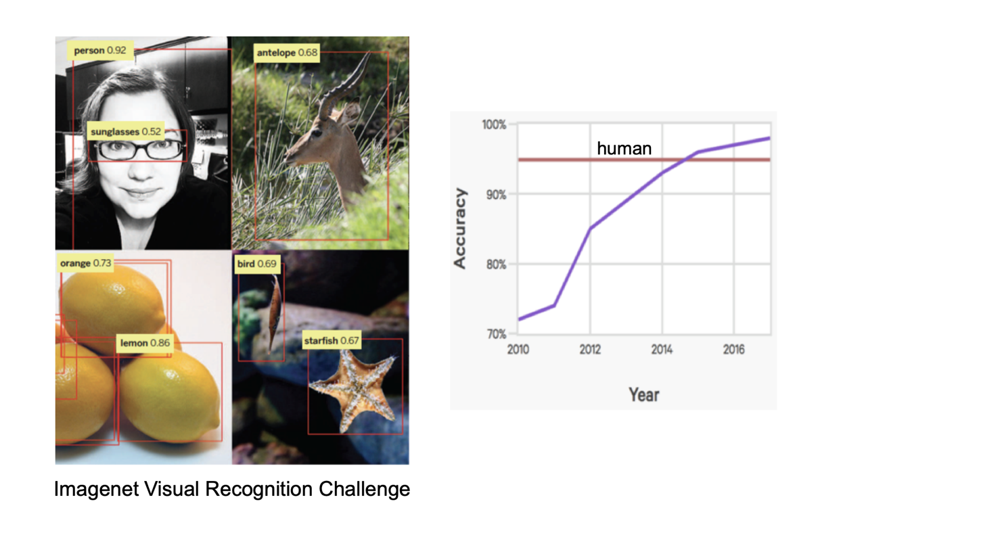

### Speech recognition

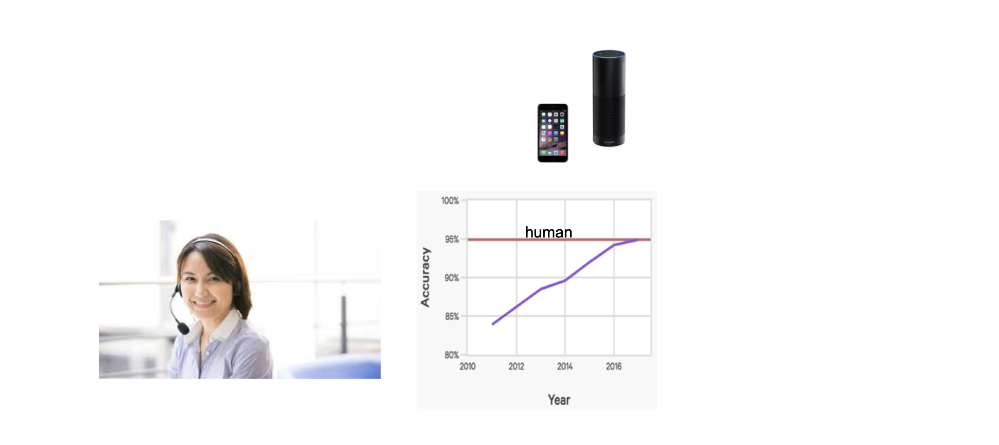

### Robots
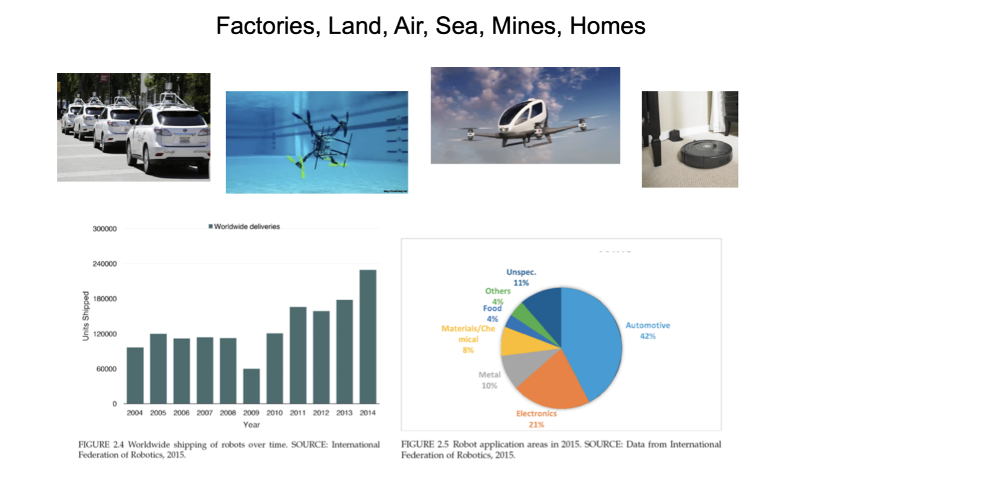

### Games and reasoning
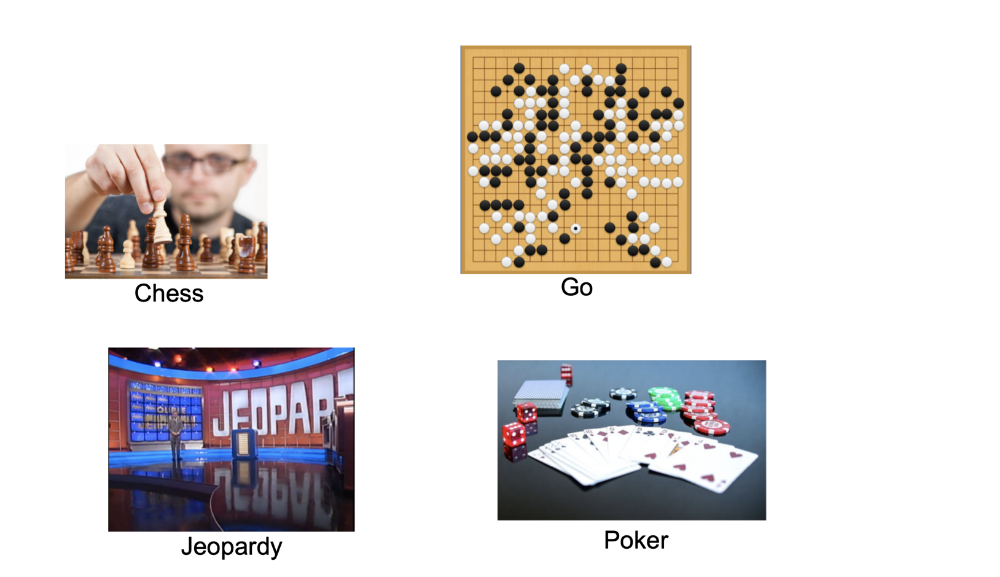

### Protein folding

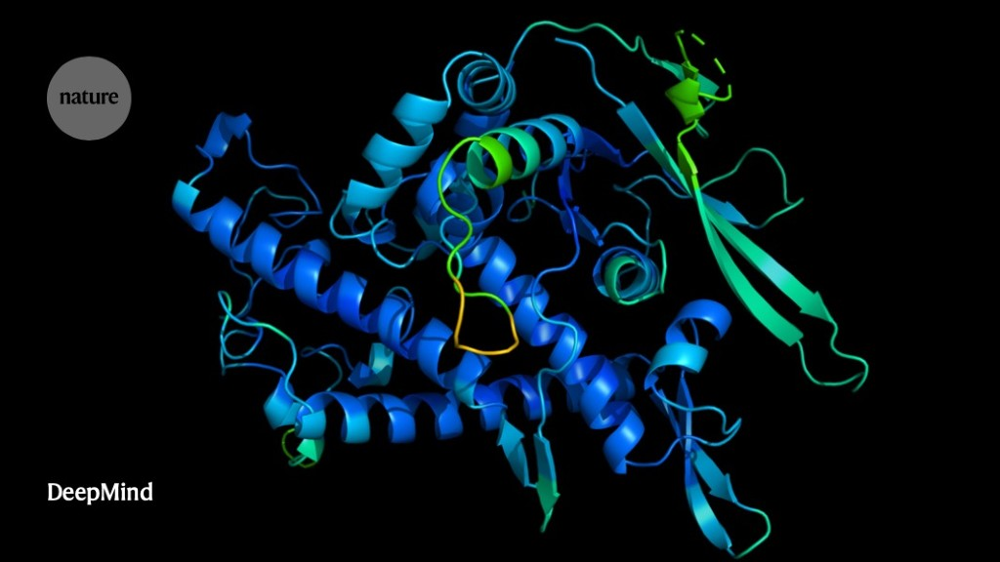

### The Key: Machine Learning

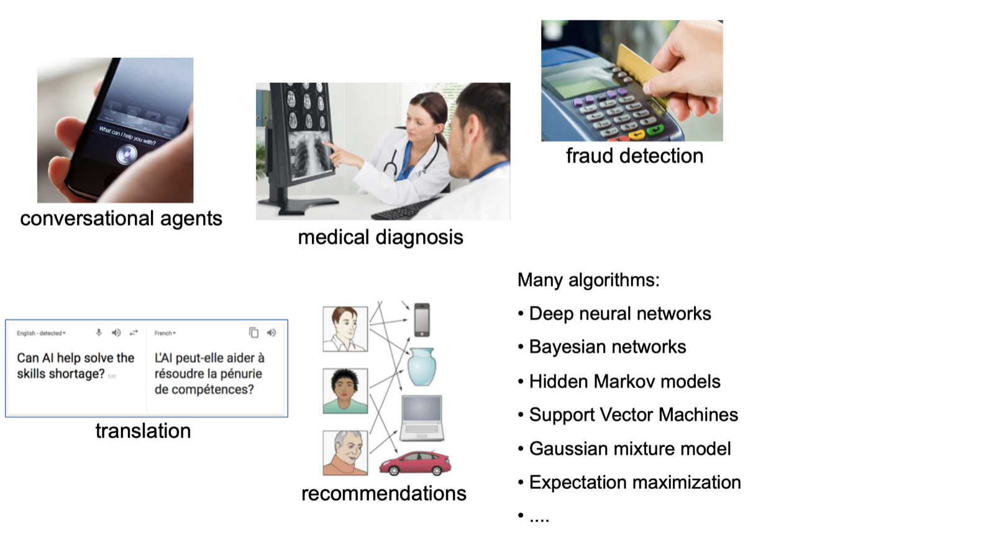

### Skin Cancer Diagnosis
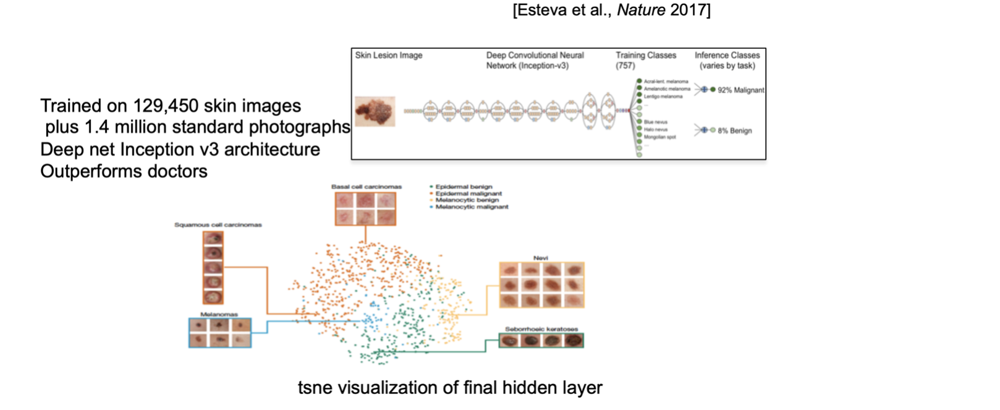

### Predict Cardiovascular Risk from Retinal Photographs
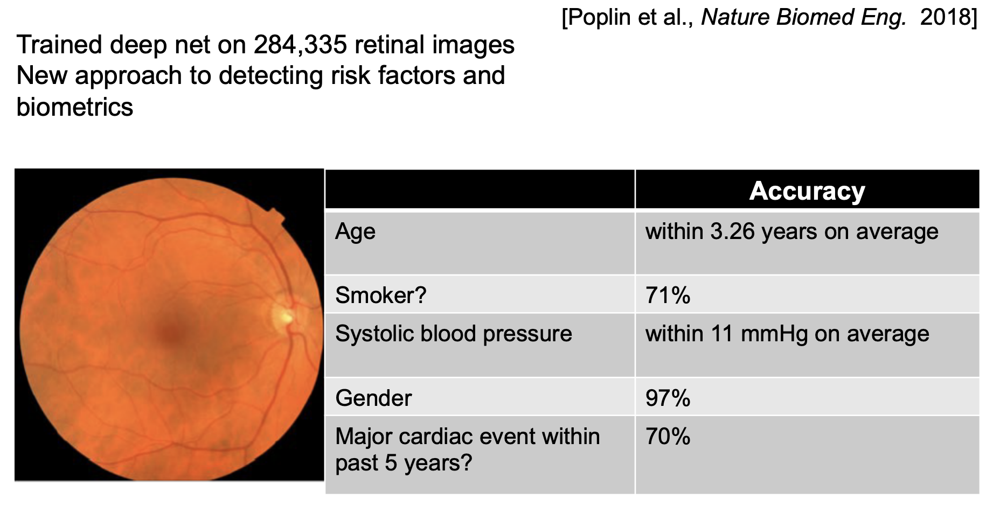

### Machine Learning Theory
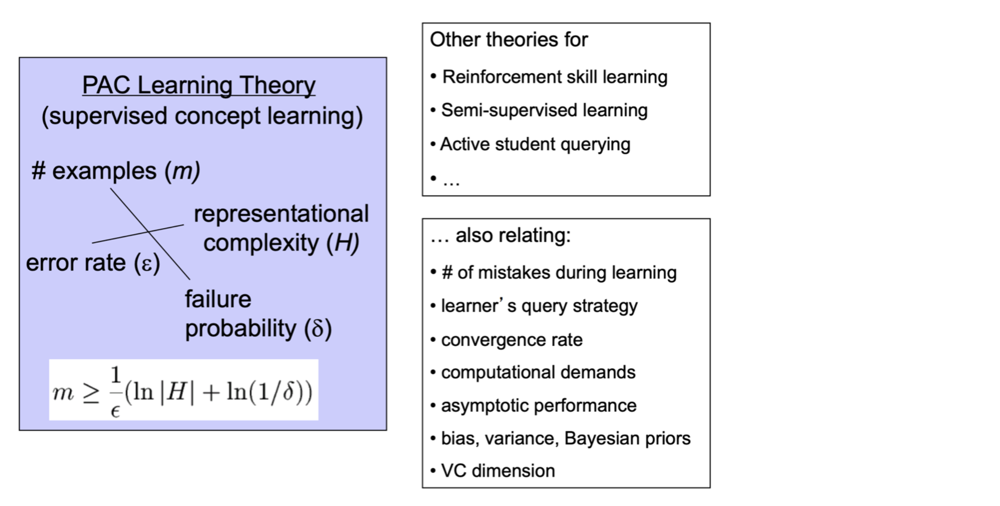

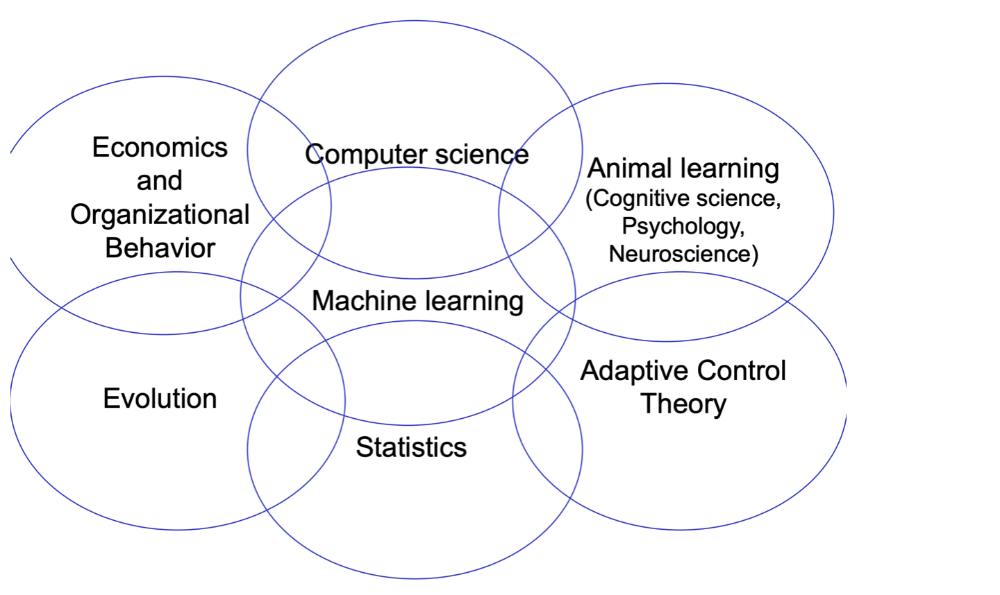

## Social impacts of Machine Learning

- Better, evidence-based, decision making in many domains
    - Medical diagnosis, Credit card fraud detection, Online tutoring, Anticipating equipment failures, Marketing, Legal sentencing, …
- Created breakthroughs in AI, with huge impact on society
    - Computer vision, speech, text processing, self-driving cars, games, …
- Raises new issues
    - Explainability
    - Bias
    - Privacy
    - If big data is key to successful ML, who controls access to the data?
    - …

## We will cover in this course
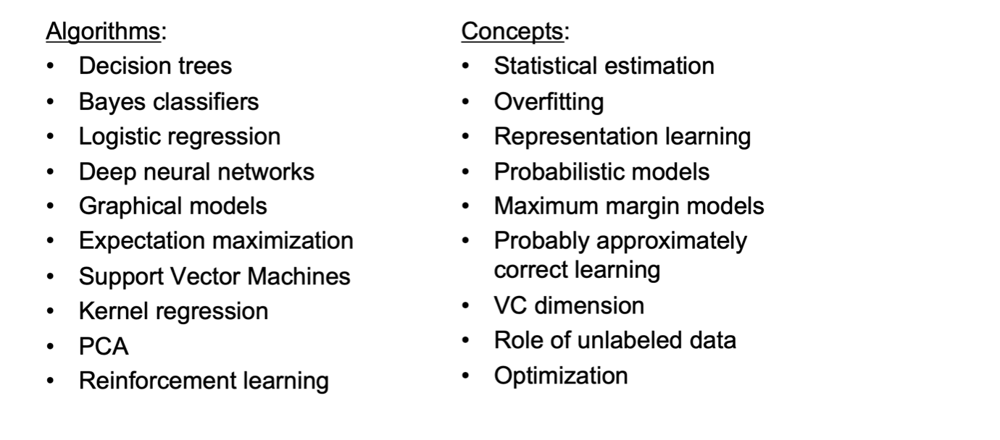

## Highlights of Course Logistics

- 4 HW assignments (36%)
- 2 exams (see schedule, 20% each)
- Project (24%)


- Homework assignments will be submitted on gradescope. HW 1 out on the 7th.
- 8 late days in total, maximum 3 per assignment.
- Collaboration is ok if you only talk to each other, and then write / implement separately.
- **Collaboration should be disclosed.** There is a dedicated section for each homework assignment. 
    - What happens if you disclose / don't disclose?
- What happens if you copy code from someone else (even if you change it)?

## Highlights of Course Logistics

- Projects will be in groups of 2 or 3
- We will propose a set of project topics for you, you can also propose your own
- Project proposal, milestone report, and final report.
- Use the GCC (Global Communication Center) for this and other writing tasks you have!
- Project proposals will be due on September 28, we will release a list of project topics soon.

## The Perceptron 

- Introduced by Rosenblatt in 1958
- Inspired by real neurons
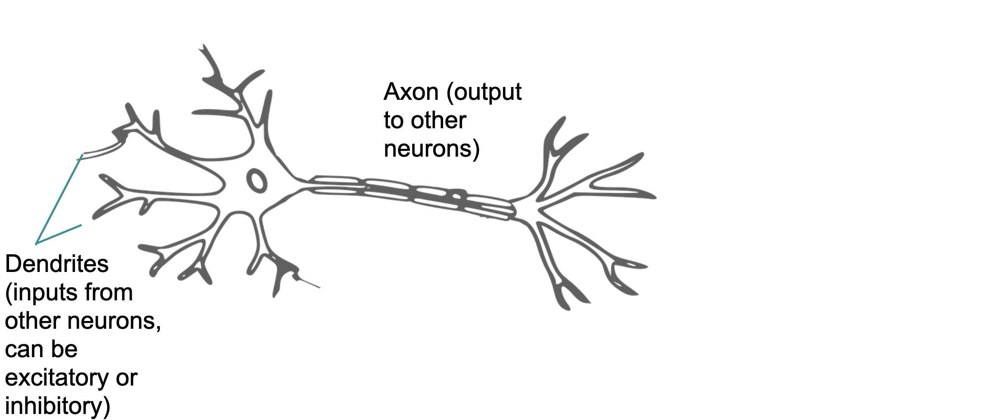

## The Perceptron 

- Introduced by Rosenblatt in 1958
- Inspired by real neurons

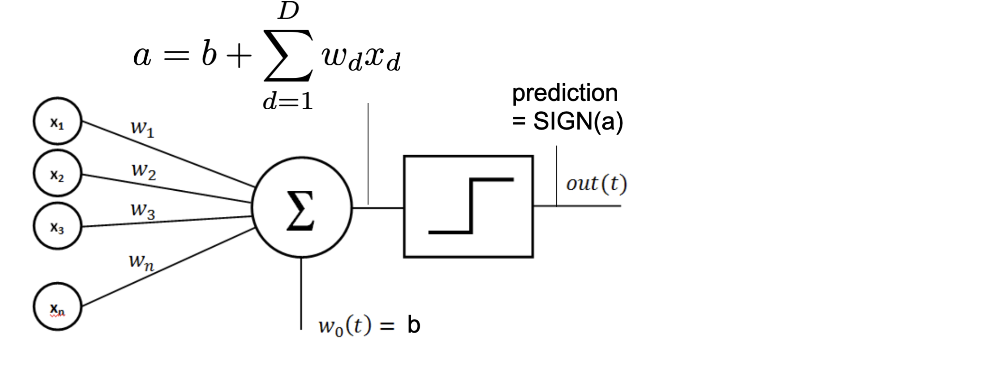

## The Perceptron

- Assume data is binary
- Assume data is linearly separable: 
    - there exist a hyperplane that perfectly divides the two classes



#### Refresher:

- Recall how to define a hyperplane:
    - a subspace whose dimension is one less than that of its ambient space
    - if x is d-dimensional:
        - $\langle {\bf x},w \rangle + b = 0$
    

In [34]:
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
plt.rcParams['text.usetex'] = True
import warnings
warnings.filterwarnings('ignore')

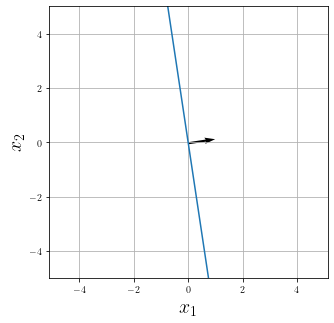

In [44]:
def plot_line(ax,xlims, w, do_norm=True):
    x1 = np.linspace(xlims[0],xlims[1],1000)
    x2_plot = (- w[2] - w[0]*x1)/w[1]  #  w[0]*x1 + w[1]*x2 + w[2] = 0
    ax.plot(x1,x2_plot)
    origin = x1[np.array(x1.shape[0]/2).astype(int)], x2_plot[int(x1.shape[0]/2)]
    nn = np.linalg.norm(w) if do_norm else 1
    ax.quiver(*origin, w[0]/nn,w[1]/nn, color='k',angles='xy', scale_units='xy', scale=1)
    ax.axis('equal')
    ax.axis([xlims[0],xlims[1],xlims[0],xlims[1]])
    ax.set_xlabel(r'$x_1$',fontsize=20); ax.set_ylabel(r'$x_2$',fontsize=20)
    ax.grid()

w = [4,0.6]
b = 0
f, ax = plt.subplots(figsize=(5,5))
plot_line(ax, [-5,5], [w[0],w[1],b])

## The Perceptron

- Assume data is binary
- Assume data is linearly separable: 
    - there exist a hyperplane that perfectly divides the two classes
\begin{align}\exists {\bf w},b ~ ~  \text{   s.t. } ~ ~ \forall({\bf x}_i,y_i) \in D,\\
y_i({\bf w}^\top {\bf x}_i +b)>0
\end{align}

\begin{align}\exists {\bf w},b ~ ~  \text{   s.t. } ~ ~ \forall({\bf x}_i,y_i) \in D,\\
y_i({\bf w}^\top {\bf x}_i +b)>0
\end{align}
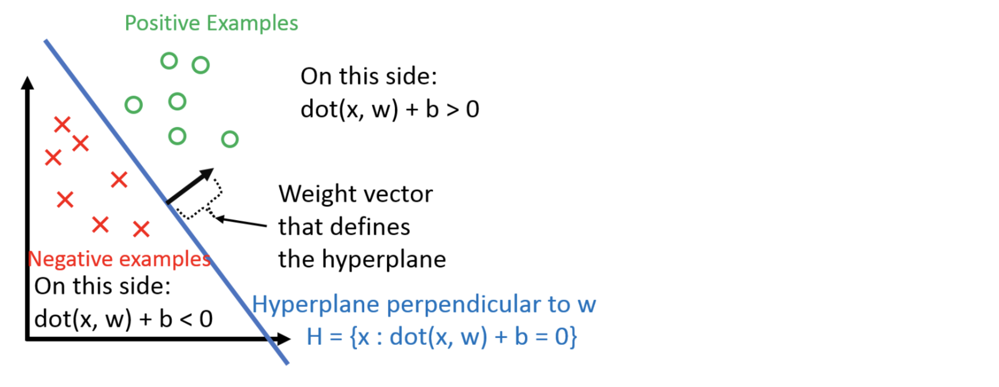

[source](https://www.cs.cornell.edu/courses/cs4780/2018fa/lectures/lecturenote03.html)

What is a separable dataset?

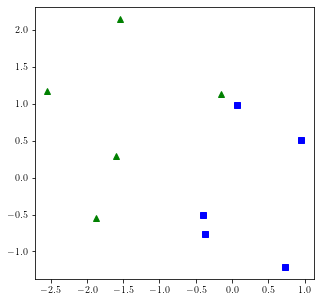

In [61]:
from sklearn import datasets

X, y = datasets.make_blobs(n_samples=10, centers=np.array([[-1,1],[1,-1]]), 
                           n_features=2, center_box=(0, 10))
y[y==0] = -1

def plot_dataset(ax,X,y):
    ax.plot(X[:, 0][y == -1], X[:, 1][y == -1], 'g^')
    ax.plot(X[:, 0][y == 1], X[:, 1][y == 1], 'bs');

f, ax = plt.subplots(figsize=(5,5))
plot_dataset(ax,X,y)

### Simplifying $w$ and $b$

- We can write ${\bf x}_i$ as:

    \begin{align}
   {\bf x_i}' &= \begin{bmatrix}
           {\bf x_i} \\
           1
         \end{bmatrix}
  \end{align}

- and incorporate $b$ into ${\bf w}$:

\begin{align}
    {\bf w}' &= \begin{bmatrix}
           {\bf w} \\
           b
         \end{bmatrix}
  \end{align}
  
  
- The same hyperplane is now defined by $ {\bf w'}^\top{\bf x'} = 0$
- Why does this work?


- We will use ${\bf w}$ and ${\bf x}$ to refer to these vectors in the rest of the lecture.

## The perceptron training algorithm

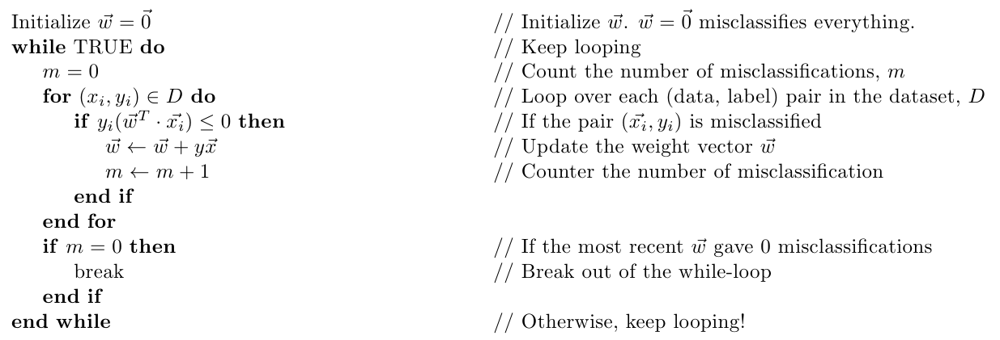

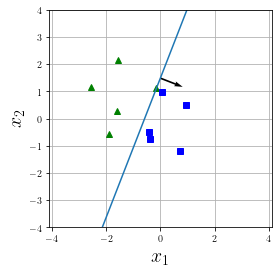

In [62]:
def perceptron_train(X,y,MaxIter=20):
    w = np.zeros((X.shape[1]))
    for i in range(MaxIter):
        m = 0
        for (xi,yi) in zip(X,y):
            if yi*w.T.dot(xi)<=0:
                w = w + yi*xi
                m = m + 1
        if m==0:
            break
    return w

f,ax = plt.subplots(figsize=(4,4))
plot_dataset(ax,X,y)
Xprime = np.hstack([X,np.ones((X.shape[0],1))])
w = perceptron_train(Xprime,y)
plot_line(ax,[-4,4], w)


In [63]:
def perceptron_train_and_plot(axs,X,y,MaxIter=20):
    w = np.zeros((X.shape[1]))
    plot_dataset(axs[0],X,y)
    plot_line(axs[0],[-4,4], w)
    plt_cnt = 0
    for i in range(MaxIter):
        m = 0
        for (xi,yi) in zip(X,y):
            if yi*w.T.dot(xi)<=0:
                w = w + yi*xi
                m = m + 1
                plt_cnt = plt_cnt + 1
                try:
                    if yi == -1:
                        axs[plt_cnt-1].plot([xi[0]],[xi[1]],'g^',markersize=10)
                    else:
                        axs[plt_cnt-1].plot([xi[0]],[xi[1]],'bs',markersize=10)
                    plot_dataset(axs[plt_cnt],X,y)
                    plot_line(axs[plt_cnt],[-4,4], w, do_norm=False)
                except:
                    print('not enough subplots')                    
        if m==0:
            break
    return w

not enough subplots
not enough subplots
not enough subplots
not enough subplots
not enough subplots


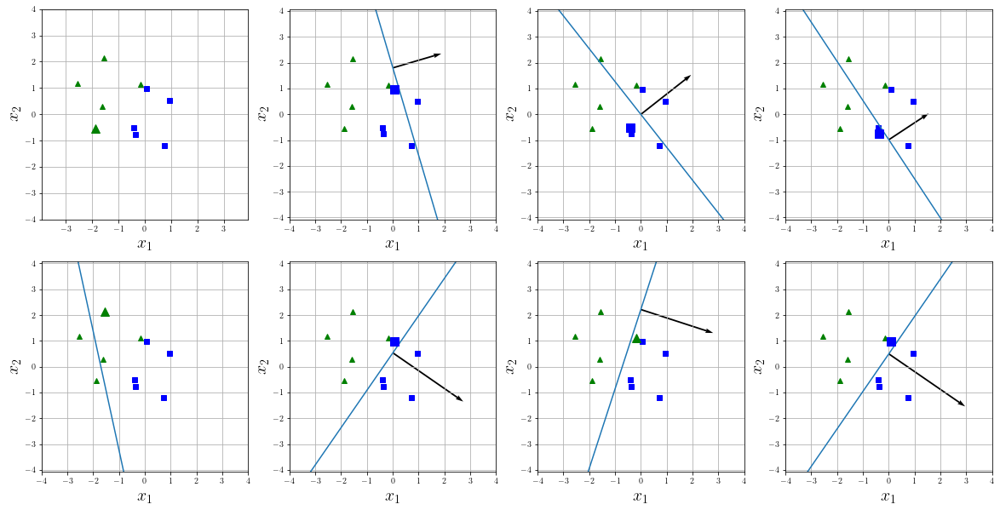

In [64]:
f,axs = plt.subplots(nrows=2,ncols=4,figsize=(20,10))
w = perceptron_train_and_plot(axs.reshape(-1),Xprime,y)

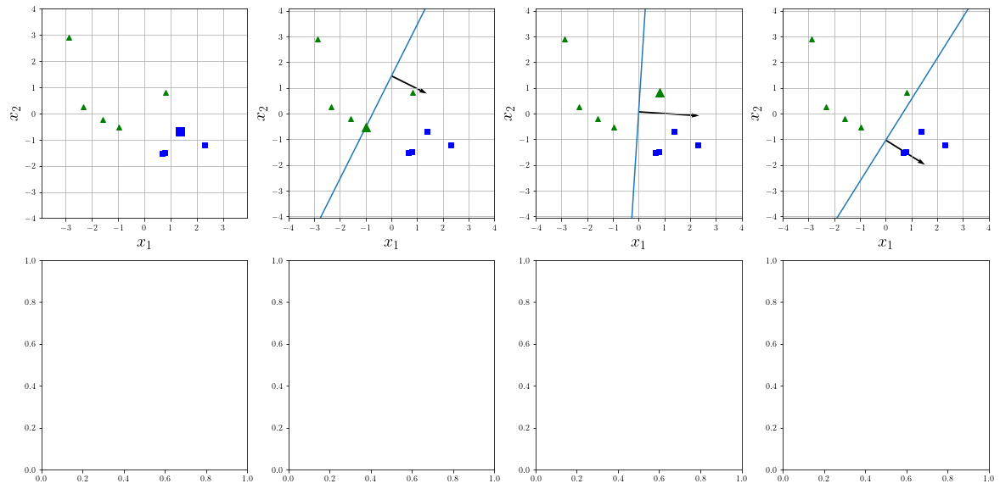

In [68]:
X, y = datasets.make_blobs(n_samples=10, centers=np.array([[-1,1],[1,-1]]), 
                           n_features=2, center_box=(0, 10))
y[y==0] = -1
Xprime = np.hstack([X,np.ones((X.shape[0],1))])
f,axs = plt.subplots(nrows=2,ncols=4,figsize=(20,10))
w = perceptron_train_and_plot(axs.reshape(-1),Xprime,y)

## Why does this work?

- what happens if you missclassify a positive example? (i.e. $ {\bf w^k}^\top{\bf x_i} < 0$)

$${\bf w^{k+1}} = {\bf w^k} + {\bf x_i}$$

\begin{align}
  {\bf w^{k+1}}^\top{\bf x_i} &= ({\bf w^k} + {\bf x_i})^\top{\bf x_i}\\
    &= {\bf w^k}^\top{\bf x_i} + {\bf x_i}^\top{\bf x_i}\\
    &> {\bf w^k}^\top{\bf x_i} 
  \end{align}

- The prediction becomes more positive (vice versa for a negative example).
- Thus the boundary is getting closer to correctly classiying ${\bf x_i}$.



## How many iterations are needed with a dataset with one example?



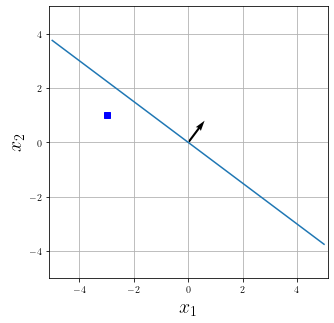

In [55]:
f, ax = plt.subplots(figsize=(5,5))
plot_line(ax, [-5,5], [3,4,0])
ax.plot([-3],[1],'bs')

## Convergence of the perceptron algorithm

 The perceptron algorithm converges in $\frac{1}{\gamma^2}$ updates if the data is linearly separable.
 
 $\gamma$ is the margin of the problem instance (defined on next slide).

#### Notion of Margin
- Assume there exists ${\bf w}^*$ such that  $ ~ ~  \forall({\bf x_i},y_i) \in D$,  $ ~ ~ ~ y_i({\bf x_i}^\top {\bf w}^*)>0$
- Also assume we rescale ${\bf w}^*$ and ${\bf x_i}$s such that:
    -  $||{\bf w}^*||=1 ~ ~ ~ $ and $~ ~ ~ ||{\bf x_i}||\le1 ~ ~ \forall {\bf x_i} $ $~~~~~$(how?)
- The margin $\gamma$ of the hyperplane ${\bf w}^*$ is the minimum distance between one 
of the points and the hyperplane:
    - $\gamma = \min_{({\bf x_i},y_i)\in \mathcal{D}} |{\bf x_i}^\top {\bf w}^*|$  $~~~~~$(since ${\bf w}^*$ is unit norm)
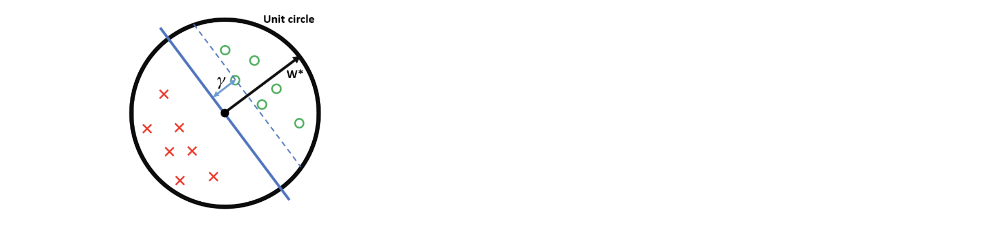
[source](https://www.cs.cornell.edu/courses/cs4780/2018fa/lectures/lecturenote03.html)

### Theorem

- Given:
    - All ${\bf x}_i$s are within the unit sphere
    - There exists a separating hyperplane ${\bf w}^*$, with $||{\bf w}^*||=1$ 
    - $\gamma$ is the margin of hyperplane ${\bf w}^*$
 
- If all of the above holds, then the Perceptron algorithm makes at most $\frac{1}{\gamma^2}$ mistakes.


- Would we want a large margin or a small margin?
- What types of datasets will converge quickly?


## Proof
[source](https://www.cs.cornell.edu/courses/cs4780/2018fa/lectures/lecturenote03.html)

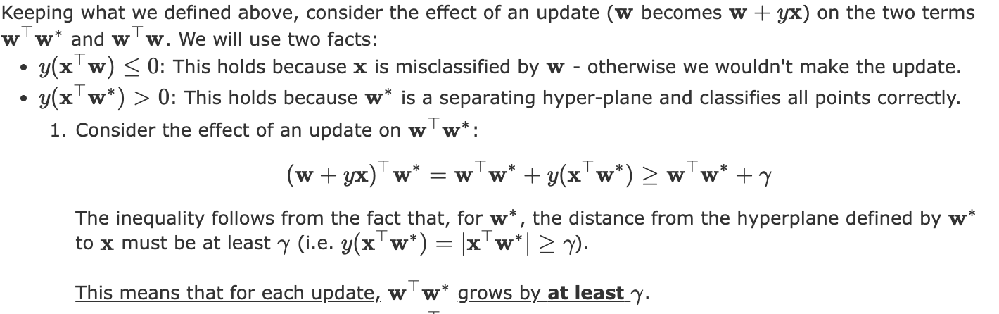

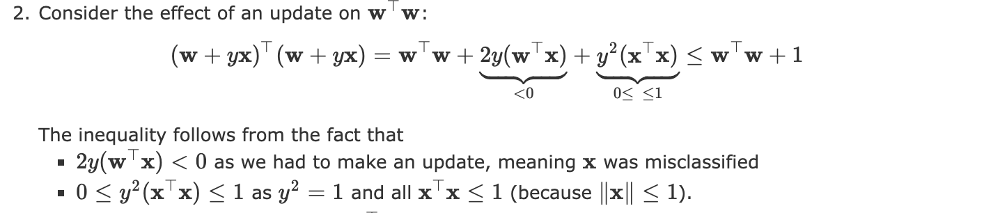

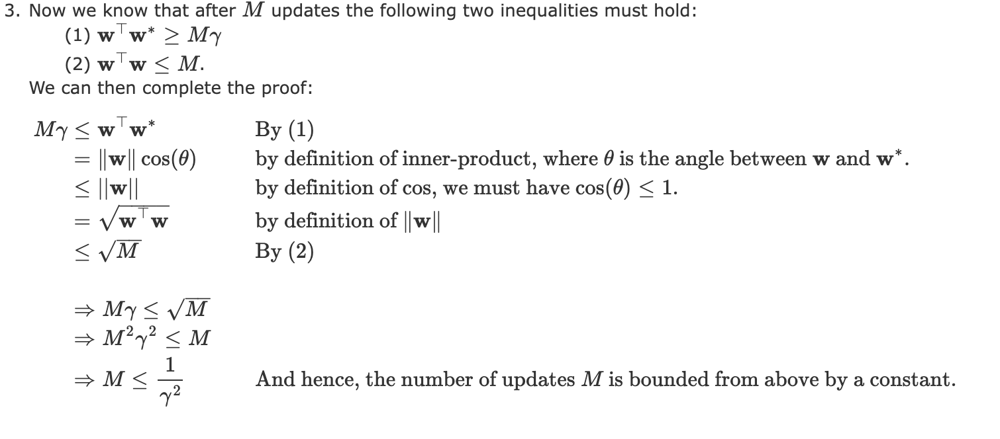

- What happens if the data is not separable?
- Does the order matter?